In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import pearsonr
from scipy.stats import chi2_contingency
from scipy.stats import f_oneway
from scipy import stats
import psycopg2
from sqlalchemy import create_engine

In [2]:
class ECOMMERCE:
    # ===== INITIALIZING OR CONSTRUCTOR =====#
    def __init__(self, filepath):
        self.filepath = filepath            # Store the file path
        self.data = pd.read_csv(filepath)   # Load CSV into a DataFrame
        
     # ===== BASIC INSPECTION ===== #   
    
    """ Displaying the dataframe """
    def Display_dataframe(self):
        return self.data
        
    """ rows and columns count """
    def Count_of_rows_columns(self):
        return self.data.shape

    """ describing the statistical information """ 
    def Statistical_info(self):
        return self.data.describe()
        
    """ displaying all the columns in df """
    def Columns(self):
        return self.data.columns

    """ data types """
    def Data_types(self):
        return self.data.dtypes

    """ checking for integer datatype """
    def Int_data(self):
        return self.data.select_dtypes(include = ['int64'])

    """ value counts of dataframe """
    def Valuecounts(self):
        return self.data.value_counts().reset_index()

    # ===== DATA CLEANING ===== #

    """ checking for null values """
    def Null_values(self):
        return self.data.isnull().sum()

    # ===== DATA TRANSFORMATION ===== #
                
    """ display the order details only from blinkit platform """
    def Blinkit_details(self):
        return self.data[self.data['Platform']=='Blinkit']

    """ display the order details only from blinkit platform with a service rating is 5 """
    def Blinkit_details_rating(self):
        return self.data[(self.data['Platform']=='Blinkit')&(self.data['Service Rating']==5)]

    """ Avg delivery time by platform  """
    def Avg_delivery_time_by_platform(self):
        return self.data.groupby('Platform')['Delivery Time (Minutes)'].min().reset_index().sort_values(by= 'Delivery Time (Minutes)',ascending= True)
        
    """ Avg platform and their service rating using groupby """
    def Avg_platform_service_rating(self):
        return self.data.groupby('Platform')['Service Rating'].mean().reset_index()
        
    """ customers and their feedbacks using filter """
    def Customer_feedbacks(self):
        return self.data.filter(items = ['Customer ID','Customer Feedback'])
        
    """average order value by product category and delivery time(minutes) using pivot tables """
    def Pivot_tables(self):
        return pd.pivot_table(self.data,
                index = 'Product Category',
                values = 'Order Value (INR)',
                columns = 'Delivery Time (Minutes)',
                aggfunc='mean')
        
    """ minimum delivery time by ascending order """
    def Minimum_delivery_time(self):
        return self.data.groupby('Customer ID')['Delivery Time (Minutes)'].min().reset_index().sort_values(by= 'Delivery Time (Minutes)',ascending= True)


    # ===== STATISTICAL ANALYSIS ===== #
    
    """ correlation between two columns """
    def Corr_coef(self,col1,col2):
        return np.corrcoef(self.data[col1],self.data[col2])[0][1]

    """ correlation among all the numeric columns with target"""
    # correlation among the columns with delivery column
    # integer columns
    def Correlation(self):
        continious_var = self.data.select_dtypes(include=['int64','float64']).columns.tolist()
        correlated = []
        target = 'Delivery Time (Minutes)'

        for col in continious_var:
            if col != target:  #  comparing all continious variable columns  with target
                result = np.corrcoef(self.data[col], self.data[target])[0][1]
                if abs(result) :
                    correlated.append((col, target, round(result, 3)))
            
        # Print results
        for pair in correlated:
            print(f"{pair[0]} vs {pair[1]}  => correlation: {pair[2]}")

        return 

    """ Anova among all the categorical variables with target """
    # Anova 
    # categorical columns
    def Anova(self):
        if 'Order ID' in self.data.columns:
            self.data = self.data.drop(columns = 'Order ID')
        categotical_var = self.data.select_dtypes(include = ['object','category']).columns.tolist()
        target = 'Delivery Time (Minutes)'

        for col in categotical_var:
            groups = [group[target].values for name,group in self.data.groupby(col)]   #  comparing all categotical variable columns  with target
            f_stat, p_val = stats.f_oneway(*groups)
            print(f"ANOVA for {col}: F = {f_stat:.3f}, p = {p_val:.3e}")
        return 

    """ chi-square test for all category columns with target column"""
    def chi_square(self):
        if 'Order ID' in self.data.columns:
            self.data = self.data.drop(columns='Order ID')
        
        categorical_vars = self.data.select_dtypes(include=['object', 'category']).columns.tolist()
        target = 'Platform'
    
        results = []
    
        for col1 in categorical_vars:
            if col1 == target:
                continue  # skip if same column as target
        
            table = pd.crosstab(self.data[col1], self.data[target])
        
            if table.shape[0] > 1 and table.shape[1] > 1:
                chi2, p, _, _ = chi2_contingency(table)
                results.append({'Variable': col1, 'p-value': p})
        return results
        
    """ outliers for order value """
    def find_outliers(self, column):
        Q1 = self.data[column].quantile(0.25)
        Q3 = self.data[column].quantile(0.75)
        IQR = Q3 - Q1 # inter quartile range
    
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
    
        outliers = self.data[(self.data[column] < lower_bound) | (self.data[column] > upper_bound)]
        print(f"Lower Bound: {lower_bound}")
        print(f"Upper Bound: {upper_bound}")
        print(f"Number of outliers: {len(outliers)}")
        return
    
    # ===== VISUALIZATIONS ===== #

    """ Generated a line plot for platforms and delivery time(minutes) columns in the dataset """
    def Line_plot(self,col1,col2):
        plt.figure(figsize=(15,10))
        sns.lineplot(data=self.data, x=col1, y=col2)
        plt.title("Delivery time by platforms")
        plt.xlabel(col1)
        plt.ylabel(col2)
        return plt.show()
        
    """ Generated a scatter plot for delivery time(minutes) and order value columns in the dataset """
    def Scatter_plot(self,col1,col2):
        plt.figure(figsize=(15,10))
        sns.scatterplot(data=self.data,x=col1,y=col2)
        plt.title("Delivery time(minutes) by order value (INR)")
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.show()
        return
        
    """ Generated a bar plot for service rating and platform columns in the dataset """
    def Bar_plot(self,col1,col2):
        avg_ratings = self.data.groupby(col1)[col2].mean().reset_index()
        plt.figure(figsize=(15,10))
        sns.barplot(data=avg_ratings, x=col1, y=col2)
        plt.title("Average Service Rating by Platform")
        plt.xlabel(col1)
        plt.ylabel(col2)
        return plt.show()
        
    """ Generated a violin plot for order value and product category """
    def Violin_plot(self,col1,col2):
        plt.figure(figsize=(15,10))
        sns.violinplot(data=self.data, x=col1, y=col2)
        plt.title(" Order value(INR) by product category")
        plt.xlabel(col1)
        plt.ylabel(col2)
        return plt.show()

    """ Histogram distribution of delivery time """
    def Histogram(self,col):
        plt.figure(figsize=(15,10))
        sns.histplot(data=self.data, x=col, bins=20, color="skyblue")
        plt.title("Histogram distribution of delivery time(minutes)")
        plt.xlabel(col)
        return plt.show()
        
    """ Pair plot """
    def pair_plot(self,col1, col2, col3):
        plt.figure(figsize=(15,10))
        sns.pairplot(self.data[[col1, col2, col3]])
        return plt.show()
        
    """ correlation among order value, service rating, delivery time """
    def Heat_map(self,col1, col2, col3):
        plt.figure(figsize=(15,10))
        sns.heatmap(self.data[[col1, col2, col3]].corr(), annot=True)
        plt.title("Correlation among order value(INR), service rating, delivery time(Minutes)")
        return plt.show()
        
    """ piechart for platforms and it's order counts """
    def Piechart(self,col):
        platform_counts = self.data[col].value_counts()
        plt.pie(
        platform_counts, 
        labels=platform_counts.index,  
        autopct='%1.1f%%',
        startangle=140
        )
        plt.title(f"Distribution of {col}")
        plt.axis('equal')  # Ensures the pie is circular
        plt.show()
        return

    """ 3d scatter plot using plotly """
    def Plotly_scatter(self,col1, col2, col3):
        return px.scatter_3d(self.data, x = col1, y = col2, z = col3, color = col1 )

    """ value counts by platform """
    def platform_val_counts(self, col):
        ax = self.data[col].value_counts().plot(title=" Value Counts by Platform")
        plt.xlabel("Platform")
        plt.ylabel("Value Counts")
        plt.tight_layout()
        return ax

    """ Distribution of order valu using kde plot """
    def kde_Plot(self,col):
        ax = self.data[col].plot(kind = 'kde', title = 'Distribution of Order value')
        plt.xlabel("order_values")
        plt.tight_layout()
        return ax

    """ generated a box plot for products and it's order values """
    def Box_plot(self,col1, col2):
        plt.figure(figsize=(15,10))
        sns.boxplot(data=self.data, x=col1, y=col2)
        plt.title(" Order value(INR) by product category")
        plt.xlabel(col1)
        plt.ylabel(col2)
        return plt.show()


    # ------------------ POSTGRESQL INTEGRATION ------------------ #
    @staticmethod
    def infer_sql_type(dtype):
        if pd.api.types.is_integer_dtype(dtype):
            return "INT"
        elif pd.api.types.is_float_dtype(dtype):
            return "FLOAT"
        elif pd.api.types.is_bool_dtype(dtype):
            return "BOOLEAN"
        elif pd.api.types.is_datetime64_any_dtype(dtype):
            return "TIMESTAMP"
        else:
            return "TEXT"
            
            
    """ Generates SQL CREATE TABLE statement based on DataFrame column dtypes"""
    def generate_create_table_statement(self, table_name="ecommerce_data"):
        """  SQL CREATE TABLE statement """
        columns = self.data.dtypes
        sql_columns = ",\n    ".join([f'"{col}" {self.infer_sql_type(dtype)}' for col, dtype in columns.items()])
        create_stmt = f"""
        CREATE TABLE IF NOT EXISTS {table_name} (
        {sql_columns}
        );
        """
        return create_stmt


    def save_to_postgres(self, conn_params, table_name="ecommerce_data"):
        """
        Creates table and inserts DataFrame records into PostgreSQL.
        Name of the PostgreSQL table "ecommerce_data".
        """
        create_stmt = self.generate_create_table_statement(table_name)
        
        try:
            conn = psycopg2.connect(**conn_params)
            cur = conn.cursor()
            
            # Create the table
            cur.execute(create_stmt)
            conn.commit()
            
            # Prepare insert statement
            columns = list(self.data.columns)
            placeholders = ', '.join(['%s'] * len(columns))
            insert_stmt = f"""
            INSERT INTO {table_name} ({', '.join(['"{}"'.format(col) for col in columns])})
            VALUES ({placeholders})
            """
            # Insert data row by row
            for _, row in self.data.iterrows():
                cur.execute(insert_stmt, tuple(row))
            conn.commit()
            
            cur.close()
            conn.close()
            print(f"Data inserted successfully into table {table_name}")
            
        except Exception as e:
            print(f"Error during PostgreSQL operation: {e}")

            
    """ Reads data from a PostgreSQL table and returns a Pandas DataFrame """
    def read_from_postgresql(self, conn_params=None, table_name="ecommerce_data"):
        
        if conn_params is None:
            conn_params = {
                'dbname': "postgres",
                'user': "postgres",
                'password': "postgres",
                'host': "localhost",
                'port': "5432"
            }

        try:
            conn = psycopg2.connect(**conn_params)
            query = f'SELECT * FROM {table_name}'
            df = pd.read_sql(query, conn)
            conn.close()
            return df
        except Exception as e:
            print(f" Error reading from PostgreSQL: {e}")
            return None


    

    



In [3]:
# creating object
obj = ECOMMERCE("Ecommerce_Delivery_Analytics_New.csv")

In [4]:
# displaying the dataframe
obj.Display_dataframe()

,Order ID,Customer ID,Platform,Order Date & Time,Delivery Time (Minutes),Product Category,Order Value (INR),Customer Feedback,Service Rating,Delivery Delay,Refund Requested
0,ORD000001,CUST2824,JioMart,19:29.5,30,Fruits & Vegetables,382,"Fast delivery, great service!",5,No,No
1,ORD000002,CUST1409,Blinkit,54:29.5,16,Dairy,279,Quick and reliable!,5,No,No
2,ORD000003,CUST5506,JioMart,21:29.5,25,Beverages,599,Items missing from order.,2,No,Yes
3,ORD000004,CUST5012,JioMart,19:29.5,42,Beverages,946,Items missing from order.,2,Yes,Yes
4,ORD000005,CUST4657,Blinkit,49:29.5,30,Beverages,334,"Fast delivery, great service!",5,No,No
...,...,...,...,...,...,...,...,...,...,...,...
99995,ORD099996,CUST5324,JioMart,49:29.5,24,Dairy,289,Packaging could be better.,3,No,No
99996,ORD099997,CUST1677,JioMart,18:29.5,19,Snacks,322,Good quality products.,4,No,No
99997,ORD099998,CUST8198,JioMart,27:29.5,41,Dairy,135,"Fast delivery, great service!",5,Yes,No
99998,ORD099999,CUST9975,JioMart,14:29.5,31,Grocery,973,Quick and reliable!,5,No,No


In [5]:
# rows and columns count
obj.Count_of_rows_columns()

(100000, 11)

In [6]:
# display all the columns
obj.Columns()

Index(['Order ID', 'Customer ID', 'Platform', 'Order Date & Time',
       'Delivery Time (Minutes)', 'Product Category', 'Order Value (INR)',
       'Customer Feedback', 'Service Rating', 'Delivery Delay',
       'Refund Requested'],
      dtype='object')

In [7]:
#data types
obj.Data_types()

Order ID                   object
Customer ID                object
Platform                   object
Order Date & Time          object
Delivery Time (Minutes)     int64
Product Category           object
Order Value (INR)           int64
Customer Feedback          object
Service Rating              int64
Delivery Delay             object
Refund Requested           object
dtype: object

In [8]:
# retriving integer datatype
obj.Int_data()

,Delivery Time (Minutes),Order Value (INR),Service Rating
0,30,382,5
1,16,279,5
2,25,599,2
3,42,946,2
4,30,334,5
...,...,...,...
99995,24,289,3
99996,19,322,4
99997,41,135,5
99998,31,973,5


In [9]:
# value counts of dataframe
obj.Valuecounts()

,Order ID,Customer ID,Platform,Order Date & Time,Delivery Time (Minutes),Product Category,Order Value (INR),Customer Feedback,Service Rating,Delivery Delay,Refund Requested,count
0,ORD099961,CUST4129,JioMart,34:29.5,21,Dairy,599,"Fast delivery, great service!",5,No,No,1
1,ORD099962,CUST7948,JioMart,34:29.5,37,Grocery,1022,Good quality products.,4,No,No,1
2,ORD099963,CUST4895,Swiggy Instamart,59:29.5,20,Personal Care,167,Packaging could be better.,3,No,No,1
3,ORD099964,CUST6880,JioMart,07:29.5,29,Personal Care,175,Excellent experience!,5,No,No,1
4,ORD099965,CUST7765,JioMart,01:29.5,50,Grocery,1152,Good quality products.,4,Yes,No,1
...,...,...,...,...,...,...,...,...,...,...,...,...
99995,ORD000004,CUST5012,JioMart,19:29.5,42,Beverages,946,Items missing from order.,2,Yes,Yes,1
99996,ORD000005,CUST4657,Blinkit,49:29.5,30,Beverages,334,"Fast delivery, great service!",5,No,No,1
99997,ORD000006,CUST3286,Blinkit,36:29.5,25,Personal Care,1939,Items missing from order.,2,No,Yes,1
99998,ORD000007,CUST2679,JioMart,22:29.5,22,Personal Care,1693,"Fast delivery, great service!",5,No,No,1


In [10]:
# sum of null values
obj.Null_values()

Order ID                   0
Customer ID                0
Platform                   0
Order Date & Time          0
Delivery Time (Minutes)    0
Product Category           0
Order Value (INR)          0
Customer Feedback          0
Service Rating             0
Delivery Delay             0
Refund Requested           0
dtype: int64

In [11]:
# retrive only blinkit platform 
obj.Blinkit_details()

,Order ID,Customer ID,Platform,Order Date & Time,Delivery Time (Minutes),Product Category,Order Value (INR),Customer Feedback,Service Rating,Delivery Delay,Refund Requested
1,ORD000002,CUST1409,Blinkit,54:29.5,16,Dairy,279,Quick and reliable!,5,No,No
4,ORD000005,CUST4657,Blinkit,49:29.5,30,Beverages,334,"Fast delivery, great service!",5,No,No
5,ORD000006,CUST3286,Blinkit,36:29.5,25,Personal Care,1939,Items missing from order.,2,No,Yes
12,ORD000013,CUST2535,Blinkit,08:29.5,45,Fruits & Vegetables,516,"Horrible experience, never ordering again.",1,Yes,Yes
15,ORD000016,CUST9279,Blinkit,07:29.5,35,Beverages,143,Good quality products.,4,No,No
...,...,...,...,...,...,...,...,...,...,...,...
99979,ORD099980,CUST9264,Blinkit,50:29.5,31,Beverages,286,Items missing from order.,2,No,Yes
99982,ORD099983,CUST2548,Blinkit,05:29.5,19,Personal Care,1852,Wrong item delivered.,1,No,Yes
99983,ORD099984,CUST5251,Blinkit,42:29.5,26,Dairy,235,"Not fresh, disappointed.",2,No,Yes
99985,ORD099986,CUST4865,Blinkit,22:29.5,21,Fruits & Vegetables,354,Very satisfied with the service.,5,No,No


In [12]:
# only from blinkit with rating value of 5
obj.Blinkit_details_rating()

,Order ID,Customer ID,Platform,Order Date & Time,Delivery Time (Minutes),Product Category,Order Value (INR),Customer Feedback,Service Rating,Delivery Delay,Refund Requested
1,ORD000002,CUST1409,Blinkit,54:29.5,16,Dairy,279,Quick and reliable!,5,No,No
4,ORD000005,CUST4657,Blinkit,49:29.5,30,Beverages,334,"Fast delivery, great service!",5,No,No
25,ORD000026,CUST7924,Blinkit,59:29.5,32,Dairy,205,Very satisfied with the service.,5,No,No
43,ORD000044,CUST2291,Blinkit,05:29.5,39,Grocery,1118,Quick and reliable!,5,No,No
44,ORD000045,CUST5803,Blinkit,26:29.5,20,Personal Care,323,"Easy to order, loved it!",5,No,No
...,...,...,...,...,...,...,...,...,...,...,...
99973,ORD099974,CUST1557,Blinkit,32:29.5,39,Snacks,250,"Fast delivery, great service!",5,No,No
99974,ORD099975,CUST7456,Blinkit,03:29.5,23,Dairy,782,"Easy to order, loved it!",5,No,No
99975,ORD099976,CUST6204,Blinkit,30:29.5,28,Grocery,305,Excellent experience!,5,No,No
99985,ORD099986,CUST4865,Blinkit,22:29.5,21,Fruits & Vegetables,354,Very satisfied with the service.,5,No,No


In [13]:
#Avg time by platforms
obj.Avg_delivery_time_by_platform()

,Platform,Delivery Time (Minutes)
0,Blinkit,5
1,JioMart,5
2,Swiggy Instamart,5


In [14]:
# Avg platform service rating
obj.Avg_platform_service_rating()

,Platform,Service Rating
0,Blinkit,3.233844
1,JioMart,3.245147
2,Swiggy Instamart,3.243415


In [15]:
# customer feedbacks
obj.Customer_feedbacks()

,Customer ID,Customer Feedback
0,CUST2824,"Fast delivery, great service!"
1,CUST1409,Quick and reliable!
2,CUST5506,Items missing from order.
3,CUST5012,Items missing from order.
4,CUST4657,"Fast delivery, great service!"
...,...,...
99995,CUST5324,Packaging could be better.
99996,CUST1677,Good quality products.
99997,CUST8198,"Fast delivery, great service!"
99998,CUST9975,Quick and reliable!


In [16]:
# avg order value by product category and delivery time
obj.Pivot_tables()

Delivery Time (Minutes),5,6,7,8,9,10,11,12,13,14,...,64,65,66,67,68,69,71,72,73,76
Product Category,,,,,,,,,,,,,,,,,,,,,
Beverages,515.924051,597.000000,544.526316,537.029851,567.597938,578.739583,566.535088,557.724138,557.013889,540.753769,...,108.0,247.000000,NaN,NaN,NaN,563.5,NaN,445.0,NaN,NaN
Dairy,476.270677,391.457143,447.377358,430.746988,429.449438,438.359551,458.771429,442.901163,442.573248,433.774011,...,376.5,555.666667,NaN,553.0,193.0,NaN,NaN,NaN,NaN,NaN
Fruits & Vegetables,370.213115,365.717949,368.100000,377.387097,373.363636,392.717391,353.593220,405.833333,384.534392,346.116751,...,390.5,366.666667,NaN,NaN,471.5,457.0,NaN,NaN,NaN,56.0
Grocery,858.901408,760.192308,873.226415,820.615385,795.697917,795.593407,807.895833,829.429448,816.358025,868.238342,...,882.0,1024.333333,1053.0,NaN,890.0,NaN,NaN,1363.0,NaN,NaN
Personal Care,1077.176923,1035.568182,1080.677419,1045.920635,1045.087500,1025.355140,1052.545455,1003.143836,1039.544218,993.000000,...,1057.0,601.500000,218.0,362.0,NaN,NaN,237.0,NaN,624.0,NaN
Snacks,295.444444,289.666667,249.409091,269.973333,264.708861,279.400000,256.449612,289.231293,292.414474,276.639594,...,443.0,281.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
# Minimum delivery time
obj.Minimum_delivery_time()

,Customer ID,Delivery Time (Minutes)
81,CUST1081,5
90,CUST1090,5
5866,CUST6866,5
38,CUST1038,5
42,CUST1042,5
...,...,...
5769,CUST6769,32
3576,CUST4576,33
1187,CUST2187,33
239,CUST1239,34


# Statistical Analysis

In [18]:
#displaying the statistical information
obj.Statistical_info()

,Delivery Time (Minutes),Order Value (INR),Service Rating
count,100000.000000,100000.000000,100000.000000
mean,29.536140,590.994400,3.240790
std,9.958933,417.409058,1.575962
min,5.000000,50.000000,1.000000
25%,23.000000,283.000000,2.000000
50%,30.000000,481.000000,3.000000
75%,36.000000,770.000000,5.000000
max,76.000000,2000.000000,5.000000


In [19]:
# correlation coefficient between two columns
obj.Corr_coef("Order Value (INR)","Order Value (INR)") # positive correlation(strongly correlated)

np.float64(1.0)

In [20]:
# finding the correlation
obj.Correlation()

Order Value (INR) vs Delivery Time (Minutes)  => correlation: 0.007
Service Rating vs Delivery Time (Minutes)  => correlation: 0.0


In [21]:
# calculating the anova
obj.Anova()

ANOVA for Customer ID: F = 0.993, p = 6.727e-01
ANOVA for Platform: F = 2.469, p = 8.469e-02
ANOVA for Order Date & Time: F = 0.813, p = 8.468e-01
ANOVA for Product Category: F = 0.430, p = 8.278e-01
ANOVA for Customer Feedback: F = 0.966, p = 4.789e-01
ANOVA for Delivery Delay: F = 69440.782, p = 0.000e+00
ANOVA for Refund Requested: F = 0.053, p = 8.187e-01


In [22]:
# calculating the chi-square
obj.chi_square()

[{'Variable': 'Customer ID', 'p-value': np.float64(0.2516895290403622)},
 {'Variable': 'Order Date & Time', 'p-value': np.float64(0.6740941431930003)},
 {'Variable': 'Product Category', 'p-value': np.float64(0.7544265224965954)},
 {'Variable': 'Customer Feedback', 'p-value': np.float64(0.9315724616758844)},
 {'Variable': 'Delivery Delay', 'p-value': np.float64(0.16810375011070328)},
 {'Variable': 'Refund Requested', 'p-value': np.float64(0.8385594002272123)}]

In [23]:
# calculating the outliers
obj.find_outliers("Order Value (INR)")

Lower Bound: -447.5
Upper Bound: 1500.5
Number of outliers: 4360


# Visualizations

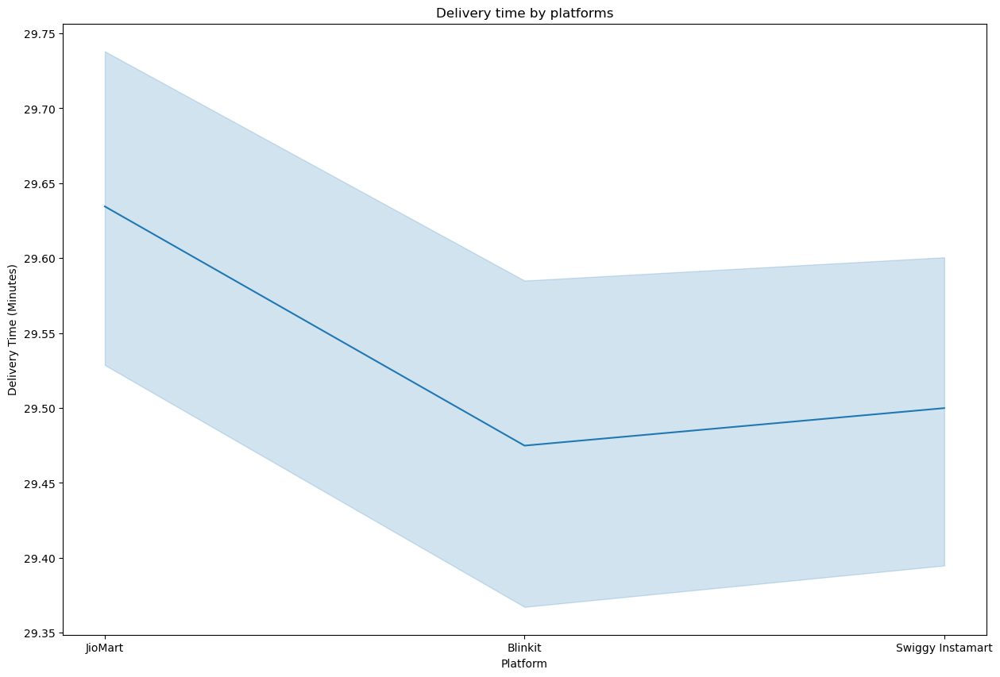

In [24]:
#line plot
obj.Line_plot("Platform","Delivery Time (Minutes)")

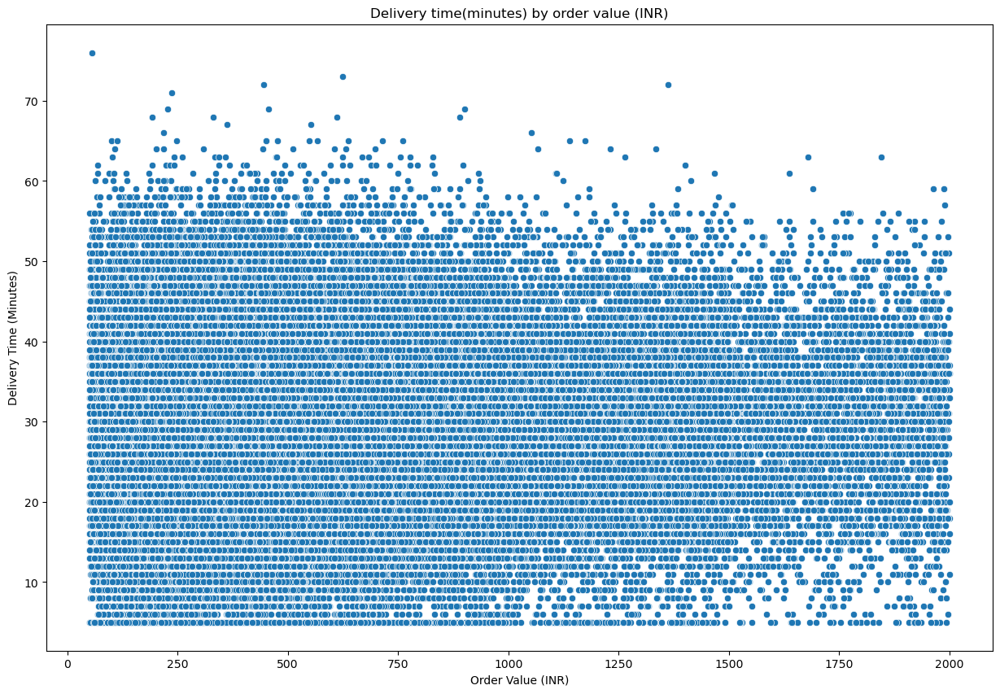

In [25]:
# scatterplot for delivery time by order value
obj.Scatter_plot("Order Value (INR)","Delivery Time (Minutes)")

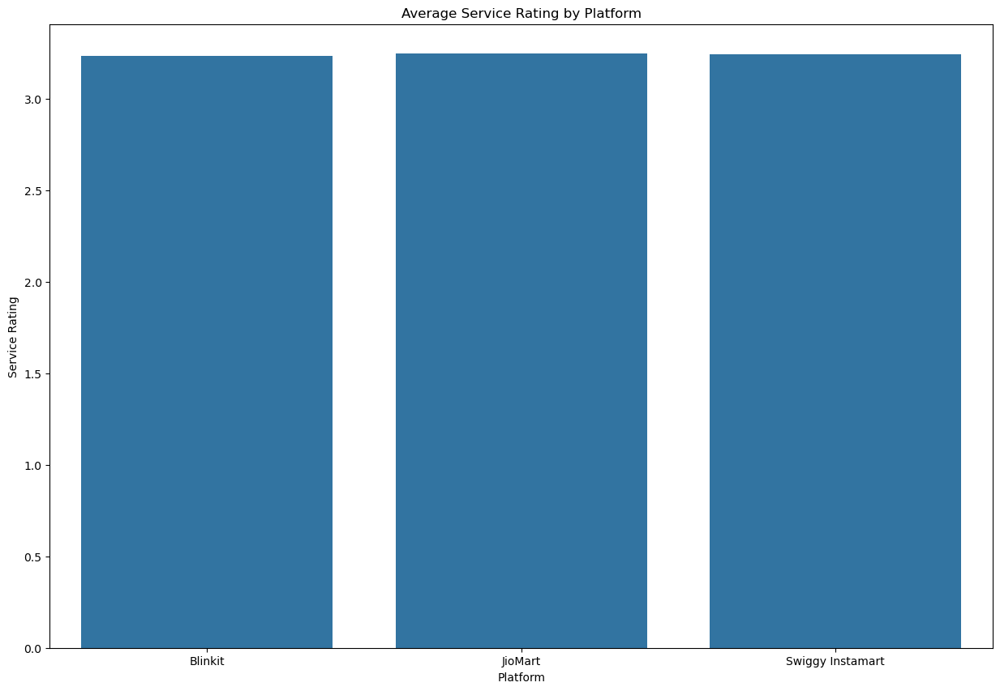

In [26]:
# avg service rating by platforms
obj.Bar_plot("Platform","Service Rating")

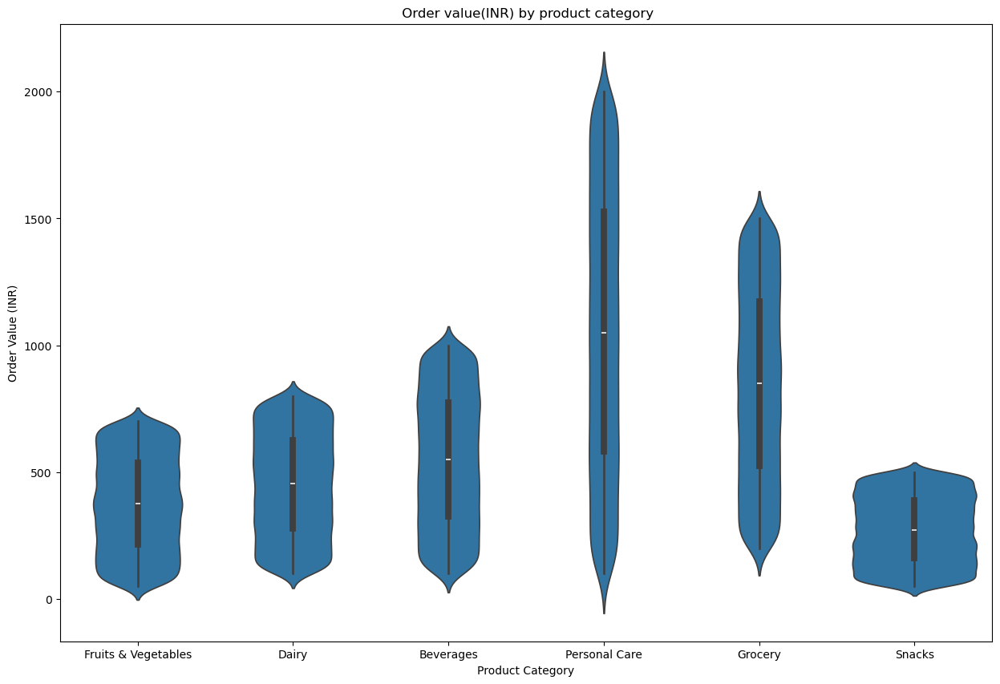

In [27]:
obj.Violin_plot("Product Category","Order Value (INR)")

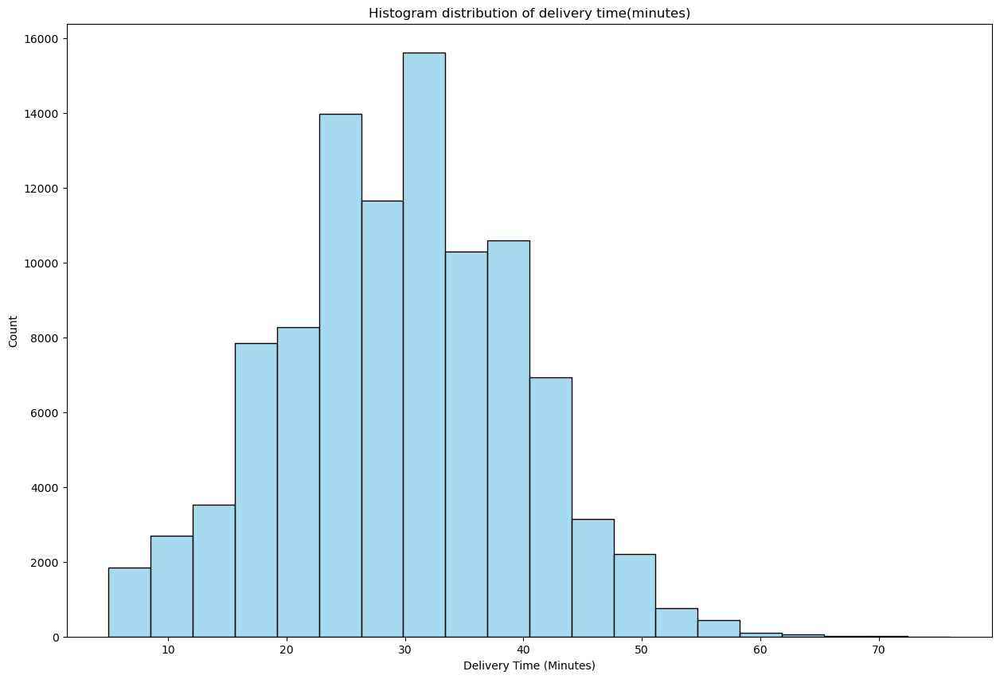

In [28]:
# histogram distribution of delivery time
obj.Histogram("Delivery Time (Minutes)")

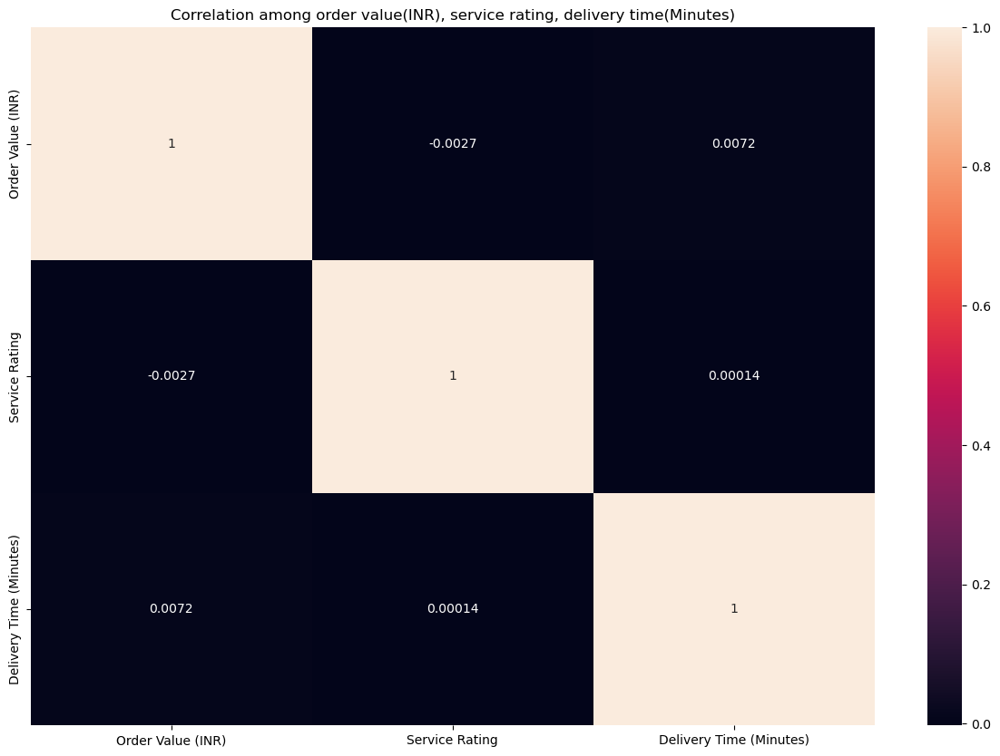

In [29]:
# correlation among "Order Value (INR)", "Service Rating", "Delivery Time (Minutes)"
obj.Heat_map("Order Value (INR)", "Service Rating", "Delivery Time (Minutes)")

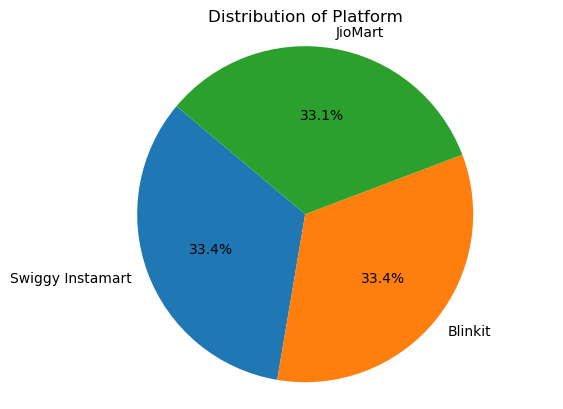

In [30]:
# orders shared by platforms
obj.Piechart("Platform")

In [31]:
# 3d scatter plot
obj.Plotly_scatter("Delivery Time (Minutes)", "Order Value (INR)", "Service Rating")

<Axes: title={'center': ' Value Counts by Platform'}, xlabel='Platform', ylabel='Value Counts'>

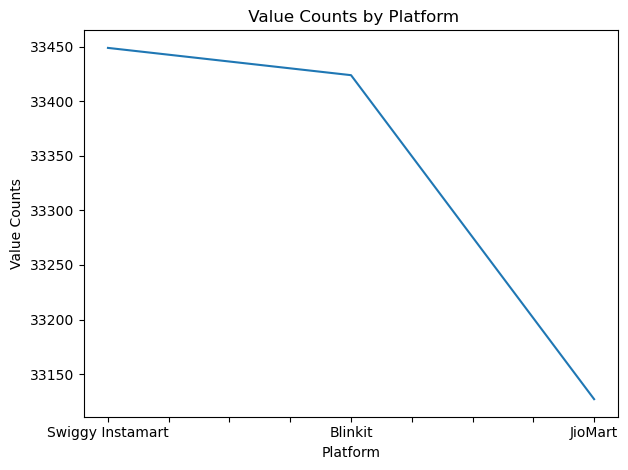

In [32]:
# value counts by platforms
obj.platform_val_counts("Platform") 

<Axes: title={'center': 'Distribution of Order value'}, xlabel='order_values', ylabel='Density'>

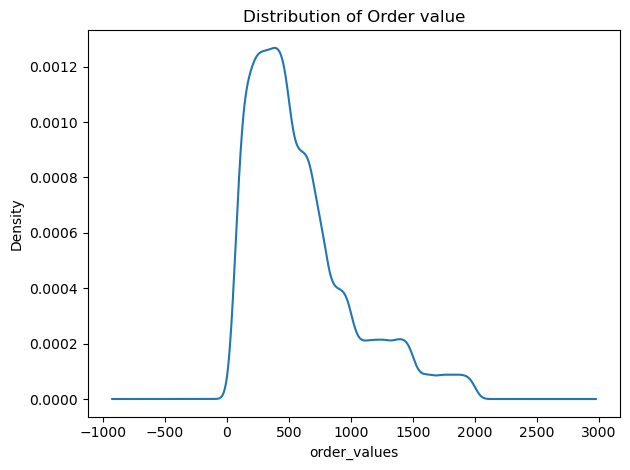

In [33]:
# distribution of order value
obj.kde_Plot("Order Value (INR)")

<Figure size 1500x1000 with 0 Axes>

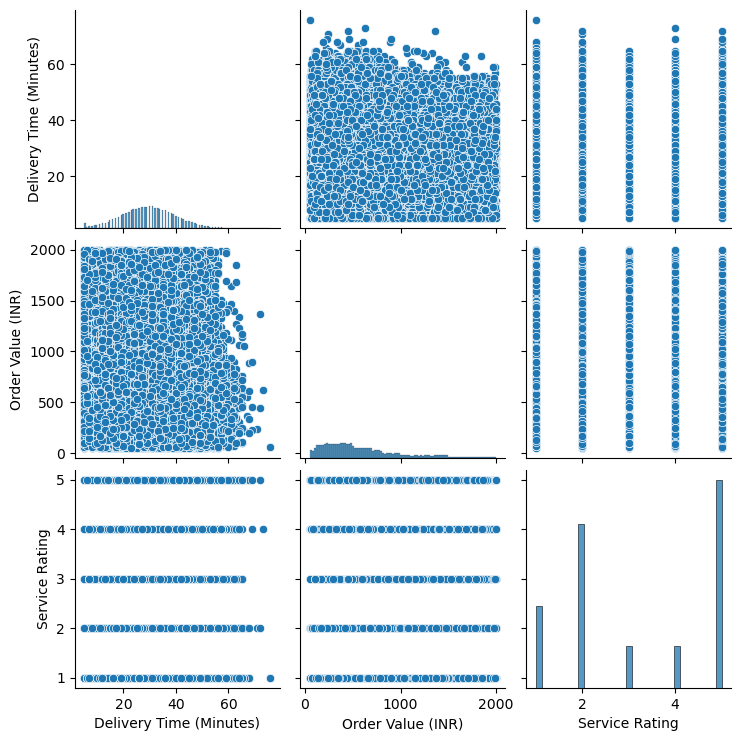

In [34]:
# pair plot
obj.pair_plot("Delivery Time (Minutes)","Order Value (INR)", "Service Rating")

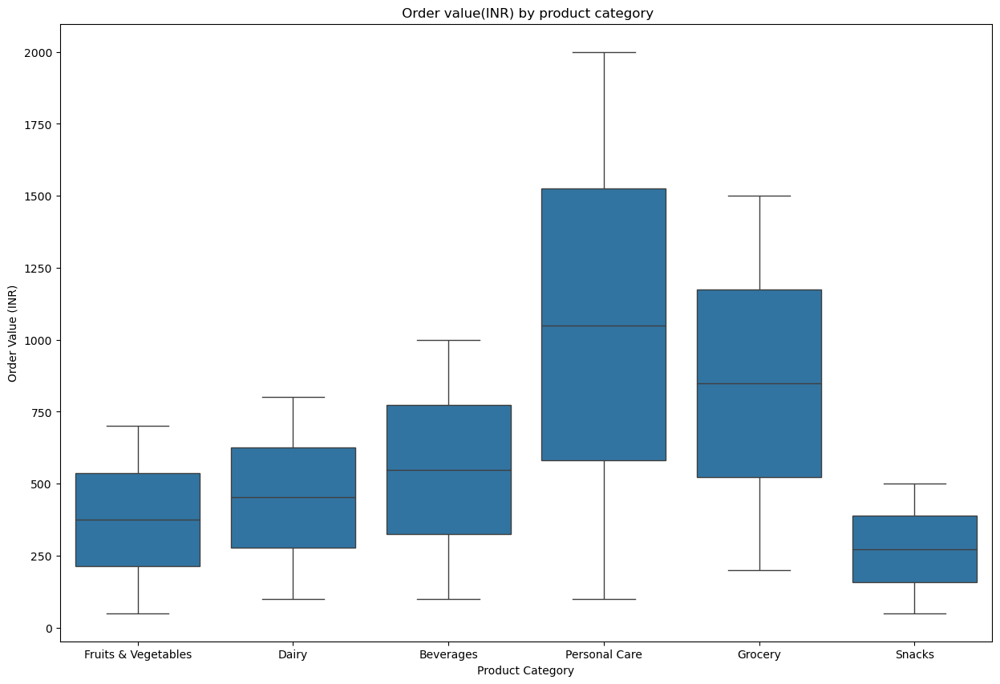

In [35]:
# box plot 
obj.Box_plot("Product Category","Order Value (INR)")

# Connecting python to postgresql

In [36]:
print(obj.generate_create_table_statement())


        CREATE TABLE IF NOT EXISTS ecommerce_data (
        "Customer ID" TEXT,
    "Platform" TEXT,
    "Order Date & Time" TEXT,
    "Delivery Time (Minutes)" INT,
    "Product Category" TEXT,
    "Order Value (INR)" INT,
    "Customer Feedback" TEXT,
    "Service Rating" INT,
    "Delivery Delay" TEXT,
    "Refund Requested" TEXT
        );
        


In [37]:
# Inserting data into postgresql database
conn_params = {
    'dbname': "postgres",
    'user': "postgres",
    'password': "postgres",
    'host': "localhost",
    'port': "5432"
}
obj.save_to_postgres(conn_params, table_name="ecommerce_data")

Data inserted successfully into table ecommerce_data


# Connecting postgresql to python

In [38]:
# Reading the data from postgresql to python
conn_params = {
    'dbname': "postgres",
    'user': "postgres",
    'password': "postgres",
    'host': "localhost",
    'port': "5432"
}
obj.read_from_postgresql(conn_params, "ecommerce_data")


C:\Users\rosan\AppData\Local\Temp\ipykernel_12384\1754426640.py:337: UserWarning:

pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.



,Order ID,Customer ID,Platform,Order Date & Time,Delivery Time (Minutes),Product Category,Order Value (INR),Customer Feedback,Service Rating,Delivery Delay,Refund Requested
0,ORD000001,CUST2824,JioMart,19:29.5,30,Fruits & Vegetables,382,"Fast delivery, great service!",5,No,No
1,ORD000002,CUST1409,Blinkit,54:29.5,16,Dairy,279,Quick and reliable!,5,No,No
2,ORD000003,CUST5506,JioMart,21:29.5,25,Beverages,599,Items missing from order.,2,No,Yes
3,ORD000004,CUST5012,JioMart,19:29.5,42,Beverages,946,Items missing from order.,2,Yes,Yes
4,ORD000005,CUST4657,Blinkit,49:29.5,30,Beverages,334,"Fast delivery, great service!",5,No,No
...,...,...,...,...,...,...,...,...,...,...,...
6199996,None,CUST5324,JioMart,49:29.5,24,Dairy,289,Packaging could be better.,3,No,No
6199997,None,CUST1677,JioMart,18:29.5,19,Snacks,322,Good quality products.,4,No,No
6199998,None,CUST8198,JioMart,27:29.5,41,Dairy,135,"Fast delivery, great service!",5,Yes,No
6199999,None,CUST9975,JioMart,14:29.5,31,Grocery,973,Quick and reliable!,5,No,No
